# **Assignment 4 - Variational Autoencoders**

Ido Levkovitch ID: 205619919

Ofir Itshak ID:205796238

Hadas Sela ID:316312842

In this assignment, we will train a model to produce new human faces with variational autoencoders (VAEs). 
Variational autoencoders let us design complex generative models of data, and fit them to large datasets. They can generate images of fictional celebrity faces (as we'll do in this assignment), high-resolution digital artwork and many more tasks. These models also yield state-of-the-art machine learning results in image generation and reinforcement learning. Variational autoencoders (VAEs) were defined in 2013 by Kingma and Wellings [1].

In this assignment, you will build, train and analyze a VAE with the CelebA dataset. You will analyze how well images can be reconstructed from the lower dimensional representations and try to generate images that look similar to the images in the CelebA dataset.

[1] Kingma, Diederik P., and Max Welling. "Auto-encoding variational bayes." arXiv preprint arXiv:1312.6114 (2013). 


# **Section 1: Variational Autoencoders**


Let us recall the structure of the variational autoencoder:

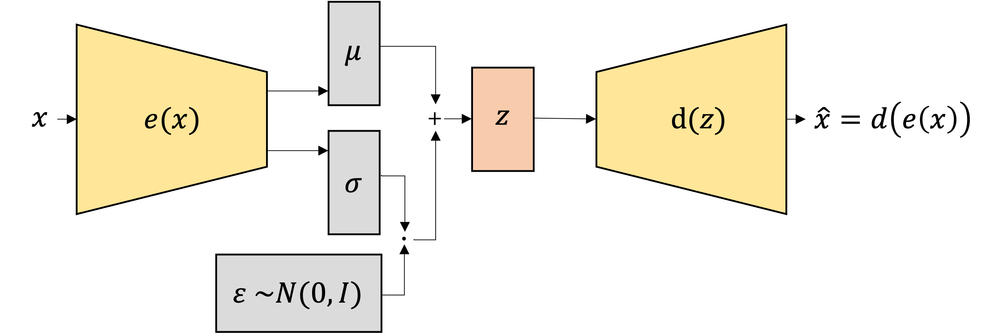

**Imports**

Before we begin, we import the needed libraries. 


You may modify the starter code as you see fit, including changing the signatures of
functions and adding/removing helper functions. However, please make sure that we can understand what you are doing and why.

In [2]:
from torchvision import datasets
from torchvision import transforms
from torch.autograd import Variable
import torch
import torch.nn as nn
import torch.nn.functional as nnF
from torchvision.utils import make_grid
from IPython.display import Image
import matplotlib.pyplot as plt
import numpy as np
import random
import torchvision.transforms.functional as F
from torchvision.utils import make_grid
import os
import zipfile

%pip install wget   
import wget

# use GPU for computation if possible: Go to RUNTIME -> CHANGE RUNTIME TYPE -> GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=7ef342a2022dac1fbfa6a73dc9f9550991cc753dfbe756f92f387d7d1216c140
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget


Connect to your Google Drive, select the path in your drive for saving the checkpoints of your model, which we will train later.

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

# Path to save the dataset.
PATH_TO_SAVE_MODEL = '/content/gdrive/MyDrive/' # TODO - UPDATE ME!

Mounted at /content/gdrive


Define random seeds in order to reproduce your results.

In [4]:
# TO DO: Set random seeds - to your choice
torch.manual_seed(1)         # Insert any integer
torch.cuda.manual_seed(1)    # Insert any integer

## Question 1. Basic Principles (10 %)




### Part (a) -- 3%

What is the difference between deterministic autoencoder we saw in class and the variational autoencoder? 

**Write your explanation here**

A deterministic autoencoder is a type of autoencoder that is designed to learn a deterministic, non-probabilistic mapping. It is trained to minimize the reconstruction error between the input data and the reconstructed data.

A variational autoencoder (VAE) is a probabilistic model that is trained to learn a continuous latent representation of the data by learning to reconstruct the data from a latent representation that is drawn from a simple, prior distribution, such as a normal distribution. The VAE uses a stochastic process to generate the latent representation, which allows it to capture the inherent uncertainty in the data and to generate new, synthetic data samples that are similar to the original data.

The difference between a deterministic autoencoder and a VAE is that a VAE is trained to maximize the likelihood of the data under the probabilistic model, whereas a deterministic autoencoder is trained to minimize the reconstruction error. This means that a VAE is able to generate new data samples that are similar to the original data, whereas a deterministic autoencoder is only able to reconstruct the input data.

### Part (b) -- 3%
In which manner Variational Autoencoder is trained? Explain.


**Write your explanation here**

It starts by encoding the input as distribution over the latent space
After that, a point from the latent space is sampled from that distribution
Next, the point that was sampled gets decoded and the reconstruction error is computed.
Then, the reconstruction error is backpropagated through the network.
The input is encoded as a distribution with a bit of variance rather than a single point so that it’s possible to naturally express the latent space regularisation. The encoder returns the distributions which are enforced to be close to a standard normal distribution.

The loss function that is minimized is made up of a reconstruction term on the final layer which makes the encoding-decoding scheme as performant as possible, along with a regularization term on the latent layer which regularizes the organisation of the latent space by virtue of making the distributions returned by the encoder close to a standard normal distribution.

The regularization term is the Kulback-Leibler divergence between the returned distribution and a standard Gaussian.


### Part (c) -- 4%

In class we saw another generative model, known as generative adversarial network (GAN). What are the differences in terms of task objective between GANs and VAEs? Give an example for a task which a VAE is more suitable than GAN, and vice versa.

**Write your explanation here**

The main difference between GANs and VAEs is in the way they are trained and the objective they are trying to optimize.

A GAN's generator samples from a relatively low dimensional random variable and produces an image. Then the discriminator takes that image and predicts whether the image belongs to a target distribution or not. Once trained, I can generate a variety of images just by sampling the initial random variable and forwarding through the generator.

A VAE's encoder takes an image from a target distribution and compresses it into a low dimensional latent space. Then the decoder's job is to take that latent space representation and reproduce the original image. Once the network is trained, I can generate latent space representations of various images, and interpolate between these before forwarding through the decoder which produces new images.

As an example, a VAE might be more suitable for generating images of specific types of objects, such as chairs or cars, where we want to be able to control the style or pose of the objects. On the other hand, a GAN might be more suitable for generating highly realistic images of objects in general, such as generating photorealistic images of landscapes or people.

## Question 2. Data (15 %)

In this assignement we are using the CelebFaces Attributes Dataset (CelebA).

The CelebA dataset, as its name suggests, is comprised of celebrity faces. The images cover large pose variations, background clutter, diverse people, supported by a large quantity of images and rich annotations. This data was originally collected by researchers at MMLAB, The Chinese University of Hong Kong.

**Overall**

- 202,599 number of face images of various celebrities
- 10,177 unique identities, but names of identities are not given
- 40 binary attribute annotations per image
- 5 landmark locations

In this torchvision version of the dataset, each image is in the shape of
$[218,178,3]$ and the values are in $[0,1]$.

Here, you will download the dataset to the Google Colab disk. It is highly recommended not to download the dataset to your own Google Drive account since it is time consuming.

In [5]:
data_path = 'C:/Users/hadas/Desktop/programming/python project/deep learning/ex4' ## TO DO -- UPDATE ME!

In [6]:


base_url = "https://graal.ift.ulaval.ca/public/celeba/"

file_list = [
    "img_align_celeba.zip",
    "list_attr_celeba.txt",
    "identity_CelebA.txt",
    "list_bbox_celeba.txt",
    "list_landmarks_align_celeba.txt",
    "list_eval_partition.txt",
]

# Path to folder with the dataset
dataset_folder = f"{data_path}/celeba"
print(dataset_folder)
os.makedirs(dataset_folder, exist_ok=True)

for file in file_list:
    url = f"{base_url}/{file}"
    dst=f"{dataset_folder}/{file}"
    # print(dst, os.path.exists(dst))
    if not os.path.exists(dst):
        wget.download(url, dst)
        # print(dst, os.path.exists(dst))
with zipfile.ZipFile(f"{dataset_folder}/img_align_celeba.zip", "r") as ziphandler:
    ziphandler.extractall(dataset_folder)

C:/Users/hadas/Desktop/programming/python project/deep learning/ex4/celeba


### Part (a) -- 5%

Apply transformations:

The data is given as PIL (Python Imageing Library) images. Since we are working with PyTorch, we wish to apply transformations to the data in order to process it properly.

Here you should apply transformations to the data. There are many kinds of transformations which can be found here: https://pytorch.org/vision/stable/transforms.html. Note that transformations can be chained together using Compose method.

Think which transformations can be suitable for this task and apply it in the form of: 

trfm = transforms.Compose([transforms.transform1(),transforms.transform2(),...])

We recommend to consider:
- transforms.ToTensor()
- transforms.Resize()

In [7]:

size=(128,128)
#trfm = transforms.Compose([]) # You can add additional transformations which you think could be fit to the data.
trfm = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(size),
    # transforms.Normalize(mean, std),
    # transforms.RandomCrop(size, padding=0)
])
training_data = datasets.CelebA(root=data_path, split='train', download=False, transform=trfm) #load the dataset (without download it directly) from our root directory on google drive disk. 
test_data = datasets.CelebA(root=data_path, split='test', download=False, transform=trfm)

### Part (b) -- 5%

In order to get in touch with the dataset, and to see what we are dealing with (which is always recommended), we wish to visualize some data samples from the CelebA dataset.

Write a function: show():

INPUT: Python list of length 32 where each element is an image, randomly selected from the training data.

OUTOUT: Showing a 8X4 grid of images.

In [ ]:
def show(imgs):
    # your code goes here:
    fig, axes = plt.subplots(8, 4,figsize=(64, 64))   # Create a figure with 8 rows and 4 columns
    axes = np.ravel(axes)  # Flatten the list of axes to make it easier to loop over
    for i in range(len(imgs)):
        img=imgs[i]
        if torch.cuda.is_available():
            img = img.cuda()
        with torch.no_grad():
          outimg = np.transpose(img.cpu().numpy(), [1,2,0])
        axes[i].imshow(outimg)
        axes[i].axis('off')
    plt.show()
    return None

### Part (c) -- 5%

Extrapolate in the image domain:

Here, randomly take 2 images from the training dataset, combine them together and plot the result. For example, consider $X_1$ and $X_2$ to be 2 images randomly taken from the training data. Plot $\alpha\cdot X_1 + (1-\alpha)\cdot X_2$. 

Explain the results, is extrapolation in the image domain reasonable?

Note: Recall that the images should be in the $[0,1]$ interval.

0.7155892002330473


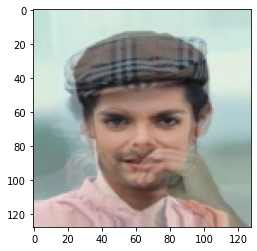

In [ ]:
# Your code goes here
# Load the two images
# Select two random images from the training dataset
index1 = random.randint(0, len(training_data) - 1)
index2 = random.randint(0, len(training_data) - 1)
image1, _ = training_data[index1]
image2, _ = training_data[index2]

# Choose a value for alpha
alpha = random.uniform(0, 1)
print(alpha)
alpha =0.5
# Combine the images using a linear interpolation
extrapolated_image = alpha * image1 + (1 - alpha) * image2

# Plot the extrapolated image
plt.imshow(extrapolated_image.transpose(0, 2).transpose(0, 1))
plt.show()


In [ ]:
print(torch.cuda.memory_summary())

# Your explanation goes here:
Extrapolation in the image domain may be reasonable if the images are similar and the extrapolation is not taking the images too far away from their original values.
But if the images are very different or the extrapolation is taking the images too far away from their original values, the resulting extrapolated image may not be meaningful or realistic. 
If we take alpha=0.5 and the extrapolation between be far we get the resulet will not be reasonable.

## Question 3. VAE Foundations (15 %)


Let us start by recalling the analytical derivation of the VAE.


The simplest version of VAE is comprised of an encoder-decoder architecture.
The *encoder* is a neural network which its input is a datapoint $ x $, its output is a hidden representation $ z $, and it has weights and biases $ \theta $. We denote the encoder's mapping by $ P_{\theta}(z|x) $. The *decoder* is another neural network which its input is the data sample $ z $, its output is the reconstructed input $x$, and its parameters $ \phi $. Hence, we denote the decoder's mapping by $ P_{\phi}(x|z) $.

The goal is to determine a posterior distribution $ P_{\theta}(z|x) $ of a latent variable $ z $ given some data evidence $ x $. However, determining this posterior distribution is typically computationally intractable, because according to Bayes:

$ (1) $ $ P(z|x) = \frac{P(x|z)P(z)}{P(x)} $

The term $ P(x) $ is called the evidence, and we can calculate it by marginalization on the latent variable:

$ P(x) = \int_{z}P(x|z)P(z)dz $

Unfortunately, this term is intractable because it requires computation of the integral over the entire latent space $z$. To bypass this intractability problem we approximate the posterior distribution with some other distribution $q(z|x_i)$. This approximation is made by the KL-divergence:

$ (2) $ $D_{KL}\big(q(z|x_i)||P(z|x_i)\big) = \int_{z}q(z|x_i)\cdot\log\big(\frac{q(z|x_i)}{P(z|x_i)}\big)dz = -\int_{z}q(z|x_i)\cdot\log\big(\frac{P(z|x_i)}{q(z|x_i)}\big)dz \geq 0 $

Applying Bayes’ theorem to the above equation yields,

$ (3) $ $ D_{KL}\big(q(z|x_i)||P(z|x_i)\big) = -\int_{z}q(z|x_i)\cdot\log\big(\frac{P(x_i|z)P(z)}{q(z|x_i)P(x_i)}\big)dz \geq 0 $

This can be broken down using laws of logarithms, yielding,
 
$ (4) $ $ -\int_{z}q(z|x_i)\cdot\big[\log\big(\frac{P(x_i|z)P(z)}{q(z|x_i)}\big)-\log(P(x_i))\big]dz \geq 0 $

Distributing the integrand then yields,

$ (5) $ $ -\int_{z}q(z|x_i)\cdot\log\big(\frac{P(x_i|z)P(z)}{q(z|x_i)}\big)dz+\int_{z}q(z|x_i)\log(P(x_i))dz \geq 0 $

In the above, we note that $ log(P(x)) $ is a constant and can therefore be pulled out of the second integral above, yielding,

$ (6) $ $ -\int_{z}q(z|x_i)\cdot\log\big(\frac{P(x_i|z)P(z)}{q(z|x_i)}\big)dz+\log(P(x_i))\int_{z}q(z|x_i)dz \geq 0 $

And since $ q(z|x_i) $ is a probability distribution it integrates to 1 in the above equation, yielding,

$ (7) $ $ -\int_{z}q(z|x_i)\cdot\log\big(\frac{P(x_i|z)P(z)}{q(z|x_i)}\big)dz+\log(P(x_i)) \geq 0 $

Then carrying the integral over to the other side of the inequality, we get,

$ (8) $ $ \log(P(x_i)) \geq \int_{z}q(z|x_i)\cdot\log\big(\frac{P(x_i|z)P(z)}{q(z|x_i)}\big)dz $

<!-- Applying rules of logarithms, we get,

$ (9) $ $ \log(P(x)) \geq \int_{z}q(z|x)\cdot\big[\log\big(P(x|z)\big)+\log\big(P(z)\big)-\log\big(q(z|x)\big)\big]dz $

Recognizing the right hand side of the above inequality as Expectation, we write,

$ (10) $ $ \log(P(x)) \geq E_{~q(z|x)}\big[\log\big(P(x,z)\big)-\log\big(q(z|x)\big)\big]dz $ -->

From Equation $ (8) $ it follows that:

$ (9) $ $ \log(P(x_i)) \geq \int_{z}q(z|x_i)\cdot\log\big(\frac{P(z)}{q(z|x_i)}\big)dz + \int_{z}q(z|x_i)\cdot\log\big(P(x_i|z)\big)dz $

Which is equivalent to:

$ (10) $ $ \log(P(x_i)) \geq -D_{KL}\big(q(z|x_i)||P(z)\big) + E_{~q(z|x_i)}\big[\log\big(P(x_i|z)\big)\big] $



The right hand side of the above equation is the Evidence Lower BOund (ELBO). Its bounds $ \log(P(x)) $ which is the term we seek to maximize. Therefore, maximizing the ELBO maximizes the log probability of our data. 


### Part (a) -- 5%
 A we see above, the $ ELBO = -D_{KL}\big(q(z|x_i)||P(z)\big) + E_{~q(z|x_i)}\big[\log\big(P(x_i|z)\big)\big] $ is comprised of 2 terms. Explain the meaning of each one of them in terms of a loss function.




**explanation:** the two terms in ELBO are: the KL-divergence and the expected value of the log-likelihood.
The KL-divergence: a measure of how one probability distribution is different from a second probability distribution. in our case (VAE) is a measures the difference between the approximate posterior distribution and the true posterior distribution, and it serves as a regularization term to prevent the model from overfitting to the training data. This term is always non-negative and is minimized during training.
The expected value of the log-likelihood: measures the quality of the reconstructions produced by the model, and it is maximized during training. This term is positive when the reconstructions are good and negative when the reconstructions are poor.

The ELBO minimized during training to optimize the model. 
The ELBO  provides a lower bound on the quality of the reconstructions produced by the model.


### Part (b) -- 10%

 As we saw in class, in traditional variational autoencoder we assume:

$ P(z) $ ~ $ N(\mu_p,\sigma_{p}^2) = \frac{1}{\sqrt{2\pi\sigma_{p}^2}}\exp\big(-\frac{(z-\mu_p)^2}{2\sigma_{p}^2}\big) $

and

$ q(z|x) $ ~ $ N(\mu_q,\sigma_{q}^2) = \frac{1}{\sqrt{2\pi\sigma_{q}^2}}\exp\big(-\frac{(z-\mu_q)^2}{2\sigma_{q}^2}\big) $

Assume $ \mu_p = 0$ and $\sigma_{p}^2 = 1 $. Show that:

$ -D_{KL}\big(q(z|x_i)||P(z)\big) = \frac{1}{2}\big[1+\log(\sigma_{q}^2)-\sigma_{q}^2-\mu_q^2\big] $ 

 

**WRITE YOUR SOLUTIUON HERE**.

We assume that: 

$ P(z) $ ~ $ N(\mu_p,\sigma_{p}^2) = \frac{1}{\sqrt{2\pi\sigma_{p}^2}}\exp\big(-\frac{(z-\mu_p)^2}{2\sigma_{p}^2}\big) $

and 

$ q(z|x) $ ~ $ N(\mu_q,\sigma_{q}^2) = \frac{1}{\sqrt{2\pi\sigma_{q}^2}}\exp\big(-\frac{(z-\mu_q)^2}{2\sigma_{q}^2}\big) $

The Kullback-Leibler (KL) divergence between two distributions, q and p, is defined as: 

$ -D_{KL}\big(q(z|x_i)||P(z)\big)=∫q(z|x_i)log(\frac{P(z)}{q(z|x_i)})dz $= $E_q[log(\frac{\frac{1}{\sqrt{2\pi\sigma_{p}^2}}\exp\big(-\frac{(z-\mu_p)^2}{2\sigma_{p}^2}\big)}{ \frac{1}{\sqrt{2\pi\sigma_{q}^2}}\exp\big(-\frac{(z-\mu_q)^2}{2\sigma_{q}^2}\big)})]$ = $E_q[log(\frac{\sigma_{q}}{\sigma_{p}})-\frac{(z-\mu_p)^2}{2\sigma_{p}^2}+\frac{(z-\mu_q)^2}{2\sigma_{q}^2}] $

$ \mu_p = 0 $ and $ \sigma_{p}^2 = 1 $ therefore we get:

$ E_q[log(\sigma_{q})-\frac{z^2}{2}+\frac{(z-\mu_q)^2}{2\sigma_{q}^2}] $

we pulled out all the constants from the expectation:

$ log(\sigma_{q})E_q[1]-\frac{1}{2}E_q[z^2]+\frac{1}{2\sigma_{q}^2}E_q[(z-\mu_q)^2] $


From the definition of variance and expectation, we know that:

(1)  $ E_q[(z-\mu_q)^2]$=$\sigma_{q}^2 $

and

$ E_q[z^2] $=$ E_q[(z-\mu_q+\mu_q)^2]$=$ E_q[(z-\mu_q)^2+2\mu_q(z-\mu_q)+\mu_q^2] $=$ \sigma_{q}^2+2\mu_qE_q[z-\mu_q]+\mu_q^2 $

$ E_q[z-\mu_q] $=0,  therefore we will accept:

(2) $ E_q[z^2]$=$\sigma_{q}^2+\mu_q^2 $

from (1)+(2) we get:

$ log(\sigma_{q})E_q[1]-\frac{1}{2}E_q[z^2]+\frac{1}{2\sigma_{q}^2}E_q[(z-\mu_q)^2] $=$ log(\sigma_{q})-\frac{1}{2}(\sigma_{q}^2+\mu_q^2)+\frac{1}{2\sigma_{q}^2}\sigma_{q}^2 $=$ \frac{1}{2}[log(\sigma_{q})^2-\sigma_{q}^2-\mu_q^2+1] $

so we accept that:

$ -D_{KL}\big(q(z|x_i)||P(z)\big)=\frac{1}{2}[log(\sigma_{q})^2-\sigma_{q}^2-\mu_q^2+1] $




**Minimizing** the loss function, over a batch in the dataset now can be written as:

$ \mathcal{L(\theta,\phi)} = -\sum_j^J\bigg(\frac{1}{2}\big[1+\log(\sigma_{q_j}^2)-\sigma_{q_j}^2-\mu_{q_j}^2\big]\bigg) - \frac{1}{M}\sum_i^M\bigg(E_{~q_{\theta}(z|x_i)}\big[\log\big(P_{\phi}(x_i|z)\big)\big]\bigg) $

where $ J $ is the dimension of the latent vector $ z $ and $ M $ is the number of samples stochastically drawn from the dataset.

## Question 4. VAE Implementation (25 %)

As seen in class, a suitable way to extract features from dataset of images is by convolutional neural network (CNN). Hence, here you will build a convolutional VAE.
\
The basic idea is to start from full resolution images, and by convolutional kernels extract the important features of the dataset. Remember that the output of the VAE should be in the same dimensions $(H_1,W_1,C_1)$ as the input images. 

**The encoder** should be comprised of convolutional layers (nn.Conv2d). Recall that the dimension of the input images is changing according to:

$ Z = \bigg(H_2(=\frac{H_1-F+2P}{S}+1),W_2(=\frac{W_1-F+2P}{S}+1),C_2\bigg) $

where $ S $ is the stride, $ F $ is the kernel size, $ P $ is the zero padding and $ C_2 $ is the selected output channels. $ Z $ is the output image.

**The decoder** should reconstruct the images from the latent space. In order to enlarge dimensions of images, your network should be comprised of transposed convolutional layers (nn.ConvTranspose2d). See the following images of the operation of transpose convolution to better understand the way it works.




***Transposed Convolution with Stride = 1***

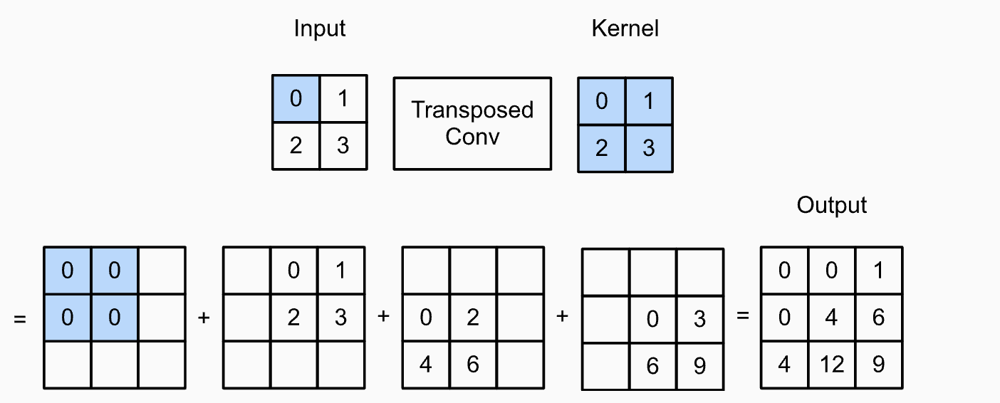

***Transposed Convolution with Stride = 2***
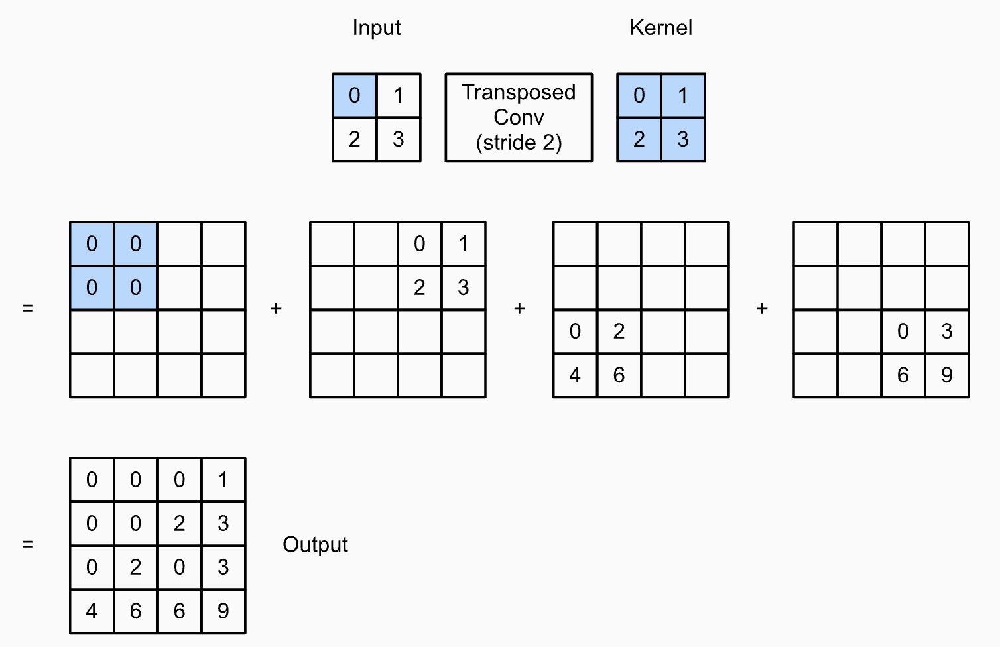

The architecture of your VAE network should be in the following form:


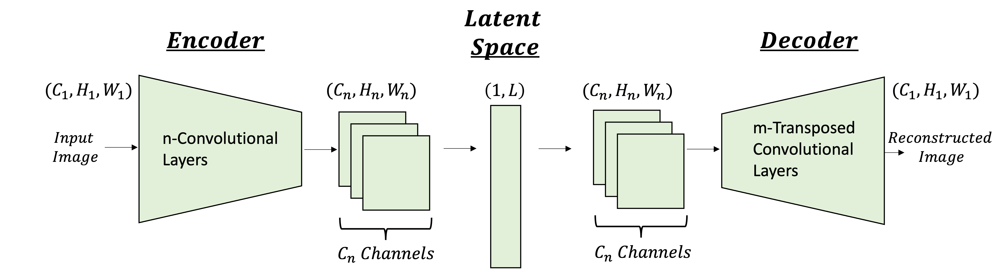

### Part (a) -- 7%

 **Encoder**

Here, you will implement the architecture of the encoder. 

The encoder should consist of 4 Blocks as follows:

BLOCK 1: 
- Convolutional layer (nn.Conv2D(in_channels, num_hidden, kernel_size=(3,3), stride=(2,2)))
- Batch Normalization(num_hidden)
- Activation Function: nn.ReLU()

BLOCK 2: 
- Convolutional layer (nn.Conv2D(num_hidden, num_hidden * 2, kernel_size=(3,3), stride=(2,2))
- Batch Normalization(num_hidden * 2)
- Activation Function: nn.ReLU()

BLOCK 3: 
- Convolutional layer (nn.Conv2D(num_hidden * 2, num_hidden * 4, kernel_size=(3,3), stride=(2,2))
- Batch Normalization(num_hidden * 4)
- Activation Function: nn.ReLU()

BLOCK 4: 
- Convolutional layer (nn.Conv2D(num_hidden * 4, num_hidden * 8, kernel_size=(3,3), stride=(2,2))
- Batch Normalization(num_hidden * 8)
- Activation Function: nn.ReLU()

In addidion to the 4 Blocks, you should add the following linear layers:

Linear $\mu$: 
- nn.Linear( ___ ,latent). 

Linear $\log(\sigma)$: 
- nn.Linear( ___ ,latent).

**NOTES:** 

- The input of the linear layer should be according to the size of the images you picked in the transformation part. (If you did resize the images)

- Consider using Padding in the convolutional layers to correct mismatches in sizes.

- In the forward function, you will have to reshape the output from the 4'th block to $ (H_4\cdot W_4\cdot C_4 , latent) $, where $ H_4 $ is the height of the output image from the 4'th block, $ W_4 $ is the width of the output image from the 4'th block and $ C_4 $ is num_hidden*8 (number of channels of the output image from the 4'th block).

**You can change any parameter of the network to suit your code - this is only a recommendation.**

In [8]:
def conv_shape(x, k=1, p=0, s=1, d=1):
    return int((x + 2*p - d*(k - 1) - 1)/s + 1)

class Encoder(nn.Module):
    def __init__(self, in_channels, num_hiddens, latent):
        super(Encoder, self).__init__()
        # YOUR CODE GOES HERE:

        self.num_hiddens = num_hiddens
        self.latent = latent
        self.block1 = nn.Sequential(
            nn.Conv2d(in_channels, self.num_hiddens, kernel_size=(3,3), stride=(2,2), padding=1),
            nn.BatchNorm2d(self.num_hiddens),
            nn.ReLU()
            )
        
        self.block2 = nn.Sequential(
            nn.Conv2d( self.num_hiddens,  self.num_hiddens * 2, kernel_size=(3,3), stride=(2,2), padding=1),
            nn.BatchNorm2d( self.num_hiddens * 2),
            nn.ReLU()
        )

        self.block3 = nn.Sequential(
            nn.Conv2d(self.num_hiddens * 2, self.num_hiddens * 4, kernel_size=(3,3), stride=(2,2), padding=1),
            nn.BatchNorm2d(self.num_hiddens * 4),
            nn.ReLU()
        )
        
        self.block4 = nn.Sequential(
            nn.Conv2d(self.num_hiddens * 4, self.num_hiddens * 8, kernel_size=(3,3), stride=(2,2), padding=1),
            nn.BatchNorm2d(self.num_hiddens * 8),
            nn.ReLU()
        )
        self.num_features=self.num_hiddens * 8*8*8
        self.fc_mu =nn.Linear(self.num_features,latent)     # Insert the input size
        self.fc_logvar = nn.Linear(self.num_features,latent) # Insert the input size

    def forward(self, inputs):
        # YOUR CODE GOES HERE:
        inputs = self.block1(inputs)
        # print(f'Encoder Block 1 output: {inputs.shape}')
        inputs = self.block2(inputs)
        # print(f'Encoder Block 2 output: {inputs.shape}')
        inputs = self.block3(inputs)
        # print(f'Encoder Block 3 output: {inputs.shape}')
        inputs = self.block4(inputs)
        # print(f'Encoder Block 4 output: {inputs.shape}')
        inputs = inputs.view(inputs.size(0), -1)
        # print(f'mu input: {inputs.shape}')
        mu = self.fc_mu(inputs)
        logvar = self.fc_logvar(inputs)


        return mu, logvar 


        


**Notice: We output $ \log\sigma $ and not $ \sigma^2 $, this is a convention when training VAEs but it is completely equivalent.**

### Part (b) -- 7%
 **Decoder**

Here, you will implement the architecture of the decoder. 

First, Apply a linear layer to the input of the decoder as follows:

- nn.Linear(latent, ___ ).

The output of the linear layer should match to $ H_4\cdot W_4\cdot C_4 $, which were the same parameters from the encoder 4'th block's output.

Then, the decoder should consist of 4 Blocks as follows:

BLOCK 1: 
- Transposed Convolutional layer (nn.ConvTranspose2d(in_channels, num_hidden // 2, kernel_size=(4,4), stride=(2,2)))
- Batch Normalization(num_hidden // 2)
- Activation Function: nn.ReLU() or nn.LeakyReLU()

BLOCK 2: 
- Transposed Convolutional layer (nn.ConvTranspose2d(num_hidden // 2, num_hidden // 4, kernel_size=(4,4), stride=(2,2)))
- Batch Normalization(num_hidden // 4)
- Activation Function: nn.ReLU() or nn.LeakyReLU()

BLOCK 3: 
- Transposed Convolutional layer (nn.ConvTranspose2d(num_hidden // 4, num_hidden // 8, kernel_size=(4,4), stride=(2,2)))
- Batch Normalization(num_hidden // 8)
- Activation Function: nn.ReLU() or nn.LeakyReLU()

BLOCK 4: 
- Transposed Convolutional layer (nn.ConvTranspose2d(num_hidden // 8, num_hidden // 8, kernel_size=(4,4), stride=(2,2)))
- Batch Normalization(num_hidden // 8)
- Activation Function: nn.ReLU() or nn.LeakyReLU()


Afterwards, we should generate an image in the same size as our input images. Thus add 1 more block consisting of:

BLOCK 5:
 - nn.Conv2d(num_hiddens//8, out_channels=3,kernel_size=(3,3), stride=(1,1), padding=(1,1)),
 - Activation function.

**NOTES:** 

- The output of the linear layer should be according to the size of the images you picked in the transformation part. (If you did resize the images)

- Consider using Padding in the  transposed convolutional layers to correct mismatches in sizes.

- In the forward function, you will have to reshape the output of the linear layer to ($ Batch, H_4, W_4, C_4 $)

- The output of the decoder should be of values in $ [0,1] $.



**You can change any parameter of the network to suit your code, this is only a recommendation.**

In [9]:
class Decoder(nn.Module):
    def __init__(self, in_channels, num_hiddens,latent, input_num_features):
        super(Decoder, self).__init__()
        # YOUR CODE GOES HERE:
        self.num_hiddens = num_hiddens
        self.input_num_features=input_num_features
        self.fc_dec = nn.Linear(latent,input_num_features) # Insert the output size

        self.block1 = nn.Sequential(
            nn.ConvTranspose2d(in_channels, self.num_hiddens // 2, kernel_size=(4,4), stride=(2,2), padding=1),
            nn.BatchNorm2d(self.num_hiddens // 2),
            nn.ReLU()
            #nn.LeakyReLU()
        )
        
        self.block2 = nn.Sequential(
            nn.ConvTranspose2d(self.num_hiddens // 2, self.num_hiddens // 4, kernel_size=(4,4), stride=(2,2), padding=1),
            nn.BatchNorm2d(self.num_hiddens // 4),
            nn.ReLU()
            #nn.LeakyReLU()
        )
        self.block3 = nn.Sequential(
            nn.ConvTranspose2d(self.num_hiddens // 4, self.num_hiddens // 8, kernel_size=(4,4), stride=(2,2), padding=1),
            nn.BatchNorm2d(self.num_hiddens // 8),
            nn.ReLU()
            #nn.LeakyReLU()
        )
        
        self.block4 = nn.Sequential(
            nn.ConvTranspose2d(self.num_hiddens // 8, self.num_hiddens // 8, kernel_size=(4,4), stride=(2,2), padding=1),
            nn.BatchNorm2d(self.num_hiddens // 8),
            nn.ReLU()
        )

        self.block5 = nn.Sequential(
            nn.Conv2d(self.num_hiddens  // 8, out_channels=3, kernel_size=(3,3), stride=(1,1), padding=(1,1)),
            nn.Sigmoid()
        ) 


    def forward(self, inputs):
        # YOUR CODE GOES HERE:
        inputs=self.fc_dec(inputs)
        inputs = inputs.view(-1, self.input_num_features//64, 8, 8)
        inputs = self.block1(inputs)
        inputs = self.block2(inputs)
        inputs = self.block3(inputs)
        inputs = self.block4(inputs)
        inputs = self.block5(inputs)
        return inputs


   
   

### Part (c) -- 4% 
**VAE Model**

Once you have the architecture of the encoder and the decoder, we want to put them together and train the network end-to-end.

Remember that in VAEs, you need to sample from a gaussian distribution at the input of the decoder. In order to backpropagate through the network, we use the reparametrization trick. The reparametrization trick is saying that sampling from $ 𝑧∼N(\mu,\sigma) $ is equivalent to sampling $ \varepsilon∼N(0,1) $ and setting $ 𝑧=\mu+\sigma⊙\varepsilon $. Where, epsilon is an input to the network while keeping your sampling operation differentiable.
The reparametrization function is given to you in the VAE class.

Here, you should write the *forward()* function and to combine all the model's settings to a final network.

In [10]:
class VAE(nn.Module):
    def __init__(self, enc_in_chnl,enc_num_hidden,dec_in_chnl,dec_num_hidden,latent):
        super(VAE, self).__init__()
        self.encode = Encoder(in_channels=enc_in_chnl, num_hiddens=enc_num_hidden,latent = latent)
        self.decode = Decoder(in_channels=dec_in_chnl, num_hiddens=dec_num_hidden,latent = latent, 
                              input_num_features=self.encode.num_features)

    # Reparametrization Trick
    def reparametrize(self, mu, logvar):
      std = torch.exp(0.5 * logvar)
      eps = torch.randn_like(std)     
      return eps.mul(std).add_(mu)

    # Initialize Weights
    def weight_init(self, mean, std):
        for m in self._modules:
            if isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Conv2d):
                m.weight.data.normal_(mean, std)
                m.bias.data.zero_()

    def forward(self, x):
        # YOUR CODE GOES HERE:
        mu, logvar = self.encode.forward(x)
        encoded = self.reparametrize(mu, logvar)
        x_rec = self.decode.forward(encoded)
        return x_rec , mu, logvar

### Part (d) -- 7% 

**Loss Function**

As we saw earlier, the loss function is based on the ELBO; Over a batch in the dataset, it can be written as:

$ \mathcal{L(\theta,\phi)} = -\sum_j^J\bigg(\frac{1}{2}\big[1+\log(\sigma_{q_j}^2)-\sigma_{q_j}^2-\mu_{q_j}^2\big]\bigg) - \frac{1}{M}\sum_i^M\bigg(E_{~q_{\theta}(z|x_i)}\big[\log\big(P_{\phi}(x_i|z)\big)\big]\bigg) $

where $ J $ is the dimension of the latent vector $z$ and $M$ is the number of samples stochastically drawn from the dataset.

**$ \beta $-Variational Autoencoder ($ \beta $-VAE)**

As seen in class, the fact that the ELBO is comprised of the sum of two loss terms implies that these can be balanced using an additional hyperparameter $\beta$, i.e.,

$ \beta\cdot D_{KL}\big(q(z|x_i)||P(z)\big) - E_{~q(z|x_i)}\big[\log\big(P(x_i|z)\big)\big] $

It is highly recommended to use the $ \beta $-loss for increasing performance. 
 


Explain what could be the purpose of the hyperparameter $ \beta $ in the loss function? If $ \beta = 1 $ is same as VAE, What is the effect of $ \beta \neq 1 $?

**Write your explanation here**

The hyperparameter beta is used to balance the two loss terms in the evidence lower bound (ELBO) objective.
By increasing the value of beta, we increase the weight of the KL divergence term relative to the reconstruction loss, which encourages the model to learn a more structured and interpretable latent space. However, if beta is set too high, the model may focus too much on the KL divergence term and neglect the reconstruction loss, resulting in poor reconstruction quality.
If beta=1, the beta-VAE becomes equivalent to a standard VAE, is mean that the KL divergence term and the reconstruction loss are given equal weight in the ELBO objective.

Here you should write specifically the code for the loss function.


In [11]:
beta = 0.1
def vae_loss(x_recon, x, mu, logvar):
    # YOUR CODE GOES HERE....
    BCE = nn.functional.binary_cross_entropy(x_recon, x, reduction='sum')
    KLD = 0.5 * torch.sum(logvar.exp() - logvar - 1 + mu.pow(2))
    return BCE + KLD*beta

 Here, define all the hyperparameters values for the training process. 

We gave you recommended values for the VAE model. You can modify and change it to suit your code better if needed.

In [12]:
learning_rate = 0.0001
batch_size = 64
num_epochs = 75
dataset_size = 30000 # How many data samples to use for training, 30,000 should be enough.

#VAE Class inputs: 
enc_in_chnl = 3
enc_num_hidden = 32
dec_in_chnl = 256
dec_num_hidden = 256

In [13]:
train_loader = torch.utils.data.DataLoader(training_data, batch_size=batch_size, shuffle=True) 
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, shuffle=True) 

In [14]:
print(torch.cuda.memory_summary())

|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      |       0 B  |       0 B  |       0 B  |       0 B  |
|       from large pool |       0 B  |       0 B  |       0 B  |       0 B  |
|       from small pool |       0 B  |       0 B  |       0 B  |       0 B  |
|---------------------------------------------------------------------------|
| Active memory         |       0 B  |       0 B  |       0 B  |       0 B  |
|       from large pool |       0 B  |       0 B  |       0 B  |

## Question 5. VAE Training (15 %)



### Part (a) -- 4% 
Complete the training function below

In [15]:
import time
def train(num_epochs,batch_size,dataset_size,model,name):
    '''  
    This is a starter code for the training process. You can modify it for your 
    own conveinient.
    num_epochs - number of training epochs
    batch_size - size of the batches
    dataset_size - How many training samples to use. 
    model - The model you are training.   

    Note: decide what are the outputs of the function. 
    '''
 
    # Your code goes Here:
    start_time = time.time()
    path='/content/gdrive/My Drive/Intro_to_Deep_Learning/Assignment4/model1'    
    train_losses=[]
    test_losses=[]
    model.train()   
    for epoch in range(num_epochs):
        train_loss=0
        for batch_idx, batch in enumerate(train_loader):
            # Since the dataset is large, train on 'dataset_size' samples.
            # print (f'epoch={epoch+1}/{num_epochs} training batch_idx={batch_idx} ')
            if dataset_size//batch_size == batch_idx: 
                  break

            x, _ = batch
            if torch.cuda.is_available():
                x = x.cuda() 
            ### FORWARD AND BACK PROP
            x_recon , mu, logvar= model(x)
            loss = vae_loss(x_recon, x, mu, logvar)
            train_loss += loss.item()
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        train_losses.append(train_loss)
        # ===================log========================
        print(f'====> Epoch: {epoch+1}/{num_epochs} Average loss: {train_loss / len(train_loader.dataset):.4f}')
                

        # Validation set
        test_loss = 0
        with torch.no_grad():
            model.eval()     
            for batch_idx, batch in enumerate(test_loader):
                # print (f'epoch={epoch+1}/{num_epochs} testing batch_idx={batch_idx} ')
                x, _ = batch
                if torch.cuda.is_available():
                    x = x.cuda()
               # ===================forward=====================
                x_recon, mu, logvar = model(x)
                test_loss += vae_loss(x_recon, x, mu, logvar).item()
        test_loss /= len(test_loader.dataset)
        test_losses.append(test_loss)
        print(f'====> Epoch: {epoch+1}/{num_epochs} Test set loss: {test_loss:.4f}')
    print('Total Training Time: %.2f min' % ((time.time() - start_time)/60))
    torch.save(model.state_dict(), path+name)
    return train_losses, test_losses

### Part (b) -- 4%  

We first train with dimension of latent space $ L=3 $

We recommend to use *weight_init()* function, which helps stabilize the training process. 

In [ ]:
latent1 = 3

if torch.cuda.is_available():
    print("Using CUDA")
    torch.cuda.empty_cache()
    model_1 = VAE(enc_in_chnl,enc_num_hidden,dec_in_chnl,dec_num_hidden,latent1).cuda()
    model_1.weight_init(mean=0, std=0.02)
else:
    print("No CUDA")
    model_1 = VAE(enc_in_chnl,enc_num_hidden,dec_in_chnl,dec_num_hidden,latent1)
    model_1.weight_init(mean=0, std=0.02)

optimizer = torch.optim.Adam(model_1.parameters(), lr=learning_rate)

Using CUDA


In [ ]:
print(torch.cuda.memory_summary())

|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      |    4939 KB |    9878 KB |    9878 KB |    4939 KB |
|       from large pool |    3200 KB |    6400 KB |    6400 KB |    3200 KB |
|       from small pool |    1739 KB |    3478 KB |    3478 KB |    1739 KB |
|---------------------------------------------------------------------------|
| Active memory         |    4939 KB |    9878 KB |    9878 KB |    4939 KB |
|       from large pool |    3200 KB |    6400 KB |    6400 KB |

Train your model, plot the train and the validation loss graphs. Explain what is seen.

In [ ]:
train_losses, test_losses=train(num_epochs,batch_size,dataset_size,model_1)

====> Epoch: 1/75 Average loss: 5339.1042
====> Epoch: 1/75 Test set loss: 28213.9072
====> Epoch: 2/75 Average loss: 5207.3575
====> Epoch: 2/75 Test set loss: 28155.4147
====> Epoch: 3/75 Average loss: 5200.6695
====> Epoch: 3/75 Test set loss: 28122.2276
====> Epoch: 4/75 Average loss: 5196.2715
====> Epoch: 4/75 Test set loss: 28114.3915
====> Epoch: 5/75 Average loss: 5194.6889
====> Epoch: 5/75 Test set loss: 28088.9951
====> Epoch: 6/75 Average loss: 5192.9406
====> Epoch: 6/75 Test set loss: 28079.6690
====> Epoch: 7/75 Average loss: 5190.7129
====> Epoch: 7/75 Test set loss: 28078.4101
====> Epoch: 8/75 Average loss: 5190.2464
====> Epoch: 8/75 Test set loss: 28064.0305
====> Epoch: 9/75 Average loss: 5189.7222
====> Epoch: 9/75 Test set loss: 28053.7871
====> Epoch: 10/75 Average loss: 5188.0961
====> Epoch: 10/75 Test set loss: 28053.4711
====> Epoch: 11/75 Average loss: 5182.4016
====> Epoch: 11/75 Test set loss: 28049.7407
====> Epoch: 12/75 Average loss: 5187.6888
====> E

In [ ]:
def plot_loss(ypoints, type):
    xpoints = np.arange(start=1, stop=len(ypoints) + 1)
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.title(f'{type} Loss')
    plt.xlim(1, len(ypoints))
    plt.plot(xpoints, ypoints)
    plt.show()
    plt.close()


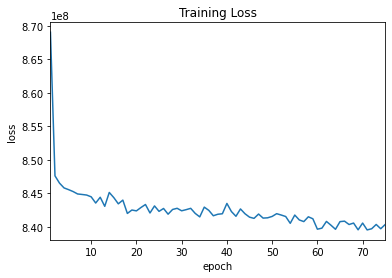

In [ ]:
plot_loss(train_losses,'Training')

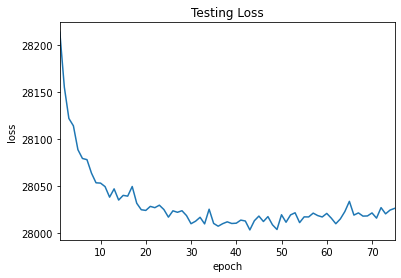

In [ ]:
plot_loss(test_losses,'Testing')

**Explain**

We can see that the loss is starting at a pretty high value of around 8700 (in the traning data) and 28200 (in the tasting data).
The loss is decreasing till the end of 75 epochs. This means that our model has learned at least something; but we need to be careful becaus it can be overfitting of the model. 

Visualize, from the test dataset, an original image against a reconstructed image. Has the model reconstructed the image successfully? Explain.

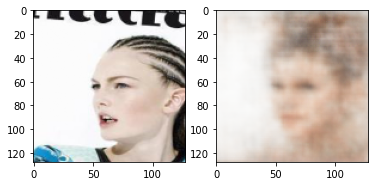

In [ ]:
# Your Code Goes Here
data = next(iter(test_loader))
images,_=data
test_image_=next(iter(images))
if torch.cuda.is_available():
    images = images.cuda()

# print(type(test_image),type(classes))
test_image =test_image_.permute(1,2,0)
with torch.no_grad():
    out, _, _=model_1(images)
    outimg = np.transpose(out[0].cpu().numpy(), [1,2,0])
_, axarr = plt.subplots(1, 2)
axarr[0].imshow(test_image)
axarr[1].imshow(outimg)
plt.show()

**Explain**

The model reconstructed the image not successfully, this because that the latent was small.

### Part (c) -- 7%  

Next, we train with larger $ L > 3 $

Based on the results for $ L = 3 $, choose a larger $ L $ to improve your results.
Train new model with your choice for $ L $.

In [16]:
latent2 =35  # TO DO: Choose latent space dimension.

if torch.cuda.is_available():
    print("Using CUDA")
    model_2 = VAE(enc_in_chnl,enc_num_hidden,dec_in_chnl,dec_num_hidden,latent2).cuda()
    model_2.weight_init(mean=0, std=0.02)
else:
    print("No CUDA")
    model_2 = VAE(enc_in_chnl,enc_num_hidden,dec_in_chnl,dec_num_hidden,latent2)
    model_2.weight_init(mean=0, std=0.02)
    
optimizer = torch.optim.Adam(model_2.parameters(), lr=learning_rate)

Using CUDA


Plot the train and the validation loss graphs. Explain what is seen.

In [17]:
# Your Code Goes Here
train_losses_latent2, test_losses_latent2=train(num_epochs,batch_size,dataset_size,model_2,'/model_2_latent=35')

====> Epoch: 1/75 Average loss: 4961.6342
====> Epoch: 1/75 Test set loss: 25524.3363
====> Epoch: 2/75 Average loss: 4722.0456
====> Epoch: 2/75 Test set loss: 25286.5720
====> Epoch: 3/75 Average loss: 4663.5541
====> Epoch: 3/75 Test set loss: 25185.2337
====> Epoch: 4/75 Average loss: 4655.9119
====> Epoch: 4/75 Test set loss: 25137.5027
====> Epoch: 5/75 Average loss: 4645.4403
====> Epoch: 5/75 Test set loss: 25097.4475
====> Epoch: 6/75 Average loss: 4635.3439
====> Epoch: 6/75 Test set loss: 25089.3389
====> Epoch: 7/75 Average loss: 4634.8171
====> Epoch: 7/75 Test set loss: 25041.5424
====> Epoch: 8/75 Average loss: 4625.7755
====> Epoch: 8/75 Test set loss: 25023.2081
====> Epoch: 9/75 Average loss: 4624.2731
====> Epoch: 9/75 Test set loss: 25007.0877
====> Epoch: 10/75 Average loss: 4623.4804
====> Epoch: 10/75 Test set loss: 24986.5357
====> Epoch: 11/75 Average loss: 4625.1799
====> Epoch: 11/75 Test set loss: 24970.0206
====> Epoch: 12/75 Average loss: 4606.4772
====> E

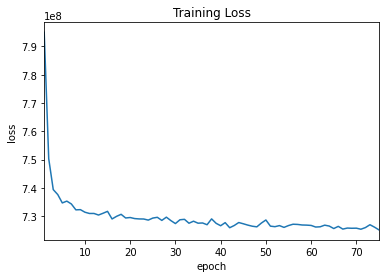

In [ ]:
plot_loss(train_losses_latent2,'Training')

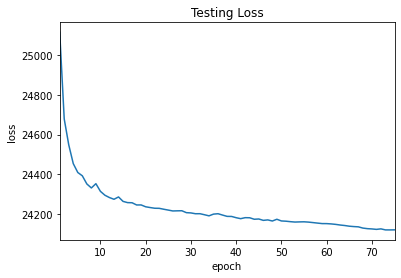

In [ ]:
plot_loss(test_losses_latent2,'Testing')

**Explain**

We can see that the loss is starting at a pretty high value of around 8000 (in the traning data) and 25000 (in the tasting data).
The loss is decreasing till the end of 75 epochs. This means that our model has learned at least something; but we need to be careful because it can be overfitting of the model.
Because we change the latent to be bigger, we got smaller loss.

Visualize, from the test dataset, an original image against a reconstructed image. Has the model reconstructed the image successfully? Are the images identical? Explain.

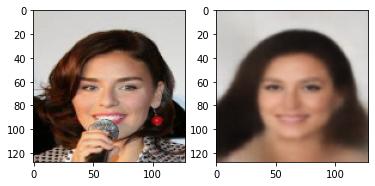

In [18]:
# Your Code Goes Here
# Your Code Goes Here
data = next(iter(test_loader))
images,_=data
test_image_=next(iter(images))
if torch.cuda.is_available():
    images = images.cuda()

# print(type(test_image),type(classes))
test_image =test_image_.permute(1,2,0)
with torch.no_grad():
    out, _, _=model_2(images)
    outimg = np.transpose(out[0].cpu().numpy(), [1,2,0])
_, axarr = plt.subplots(1, 2)
axarr[0].imshow(test_image)
axarr[1].imshow(outimg)
plt.show()

**explanation**

The model reconstructed the image successfully in the face array because we increaed the size of the latent. But still the images are not the same.


 What will happened if we choose extremely high dimension for the latent space?

**Write your explanation here**

If we choose an extremely high dimension for the latent space it can make result of overfitting. This is because a high-dimensional latent space allows the model to represent a larger number of possible patterns in the data, which can make it easier for the model to fit to the training data. This may also make the model more prone to memorizing the training data and less able to generalize to unseen data.


 
Did you output blurry reconstructed images? If the answer is yes, explain what could be the reason. If you got sharp edges and fine details, explain what you did in order to achieve that. 

Note: If you got blurry reconstructed images, just explain why. You dont need to change your code or retrain your model for better results (as long as your results can be interpreted as a human face).
 

**Write your explanation here**

There are a few reasons why we get blurry reconstructed images.
the first one, we choose small number of epochs, or the model didnt train with enough data. The model may not have learned enough about the structure of the data to accurately reconstruct the inputs.

the second reason can be that blurry reconstructed images can also be caused by noise or corruption in the input data, which can make it more difficult for the model to accurately reconstruct the original input. maybe we nois the data in the model traninig.

## Question 6: Generate New Faces (10 %)

Now, for the fun part!

We are going to generate new celebrity faces with our VAE models. A function for new faces generation is given to you. Modify it (if needed) to fit your code. 



In [20]:
# creates random noise sample in the correct shape.
def generate_faces(model, grid_size, latent):
    model.eval()
    dummy = torch.empty([batch_size,latent])
    z = torch.randn_like(dummy).to(device)

    #insert the random noise to the decoder to create new samples.
    sample = model.decode(z)
    new_face_list = []

    j=0
    while j < grid_size: 
        new_face_list.append(sample[j])
        j+=1

    grid = make_grid(new_face_list)
    print(len(new_face_list))
    if torch.cuda.is_available():
            img = grid.cuda()
    # img.show()
    show(new_face_list)

In [21]:
def show(imgs):
    # your code goes here:
    fig, axes = plt.subplots(8, 4,figsize=(64, 64))   # Create a figure with 8 rows and 4 columns
    axes = np.ravel(axes)  # Flatten the list of axes to make it easier to loop over
    for i in range(len(imgs)):
        img=imgs[i]
        if torch.cuda.is_available():
            img = img.cuda()
        with torch.no_grad():
          outimg = np.transpose(img.cpu().numpy(), [1,2,0])
        axes[i].imshow(outimg)
        axes[i].axis('off')

    plt.show()
    return None

**Model 1 ($L = 3$) results:**

32


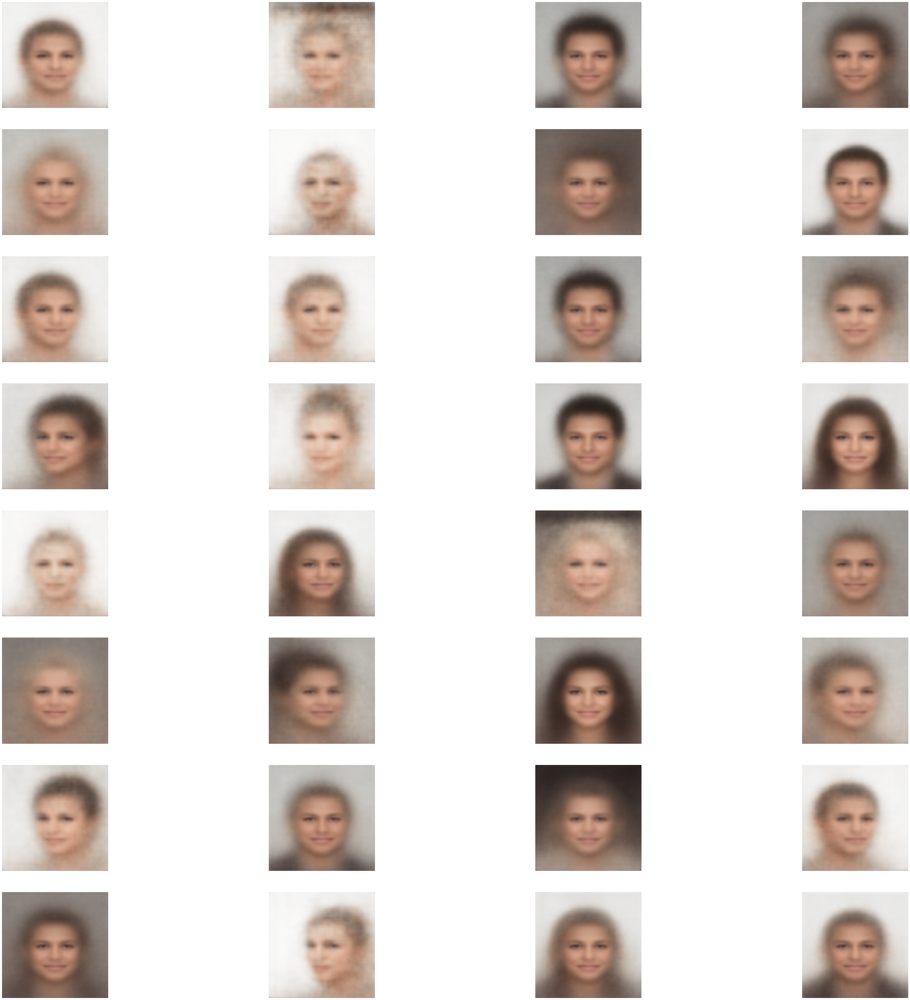

In [ ]:
generate_faces(model_1,grid_size=32,latent=latent1)

**Model 2 results:**

32


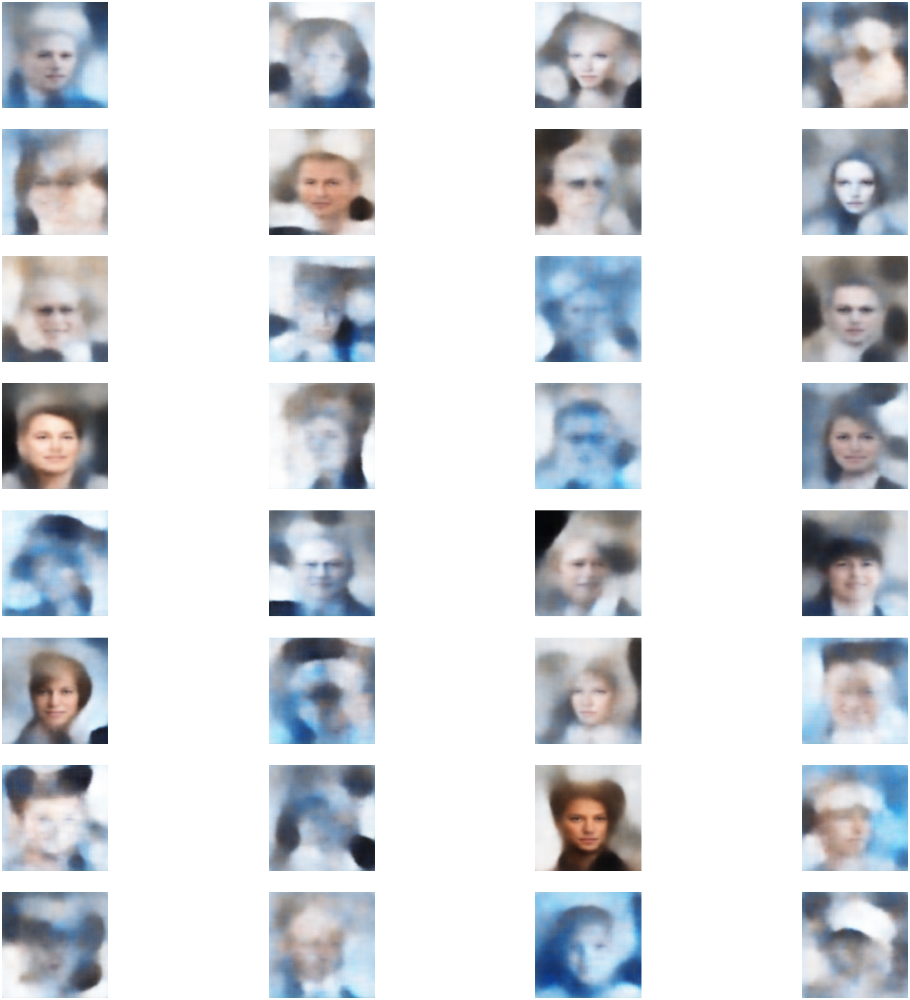

In [22]:
generate_faces(model_2,grid_size=32,latent=latent2)

*Q1:* Generate new faces with VAE model with latent space dimension = 3. Did you get diverse results? What are the most prominent features that the latent space capture? 

*Q2:* Generate new faces with VAE model with your decision for latent space dimension. What are the most prominent features that the latent space capture? 

*Q3:* What are the differences? Your results are similar to the dataset images? Do you get realistic images for your chosen latent space dimension? If not, change your decision or your network to acheive more realistic results.

**YOUR ANSWERS GOES HERE**

**# Q1 Answer:** The most prominent features that the latent space capture is the face and the shape of the face.

**# Q2 Answer:** The most prominent features that the latent space capture is the shape of the face, background and in some image the face too 

**# Q3 Answer:** Some of the image are realistic but some of them unrealistic. The big diffrenece between the two generate are the features. In the first generate the most prominent features is the face and nothing else. In the second  generate we get the th face and the background because the latent is more high.

## Question 7: Extrapolation (10 %)

Recall that we extrapolate in the images domain in Question 2, part (c).
Here, extrapolate in the latent space domain to generate new images.

Define $ \beta = [0, 0.1, 0.2, ... , 0.9, 1] $ and randomly sample from $Z \sim \mathcal{N(0,1)}$ 2 different samples and generate 2 new face images: $ X_1, X_2 $.

Extrapolate in the latent domain as follows: $ \beta_i\cdot Z_1 + (1-\beta_i)\cdot Z_2 $ for each $ \beta_i \in \beta $.

Plot the extrapolation of the images for each $ \beta $ and discuss your results. 
Repeat the process for 3 different samples.



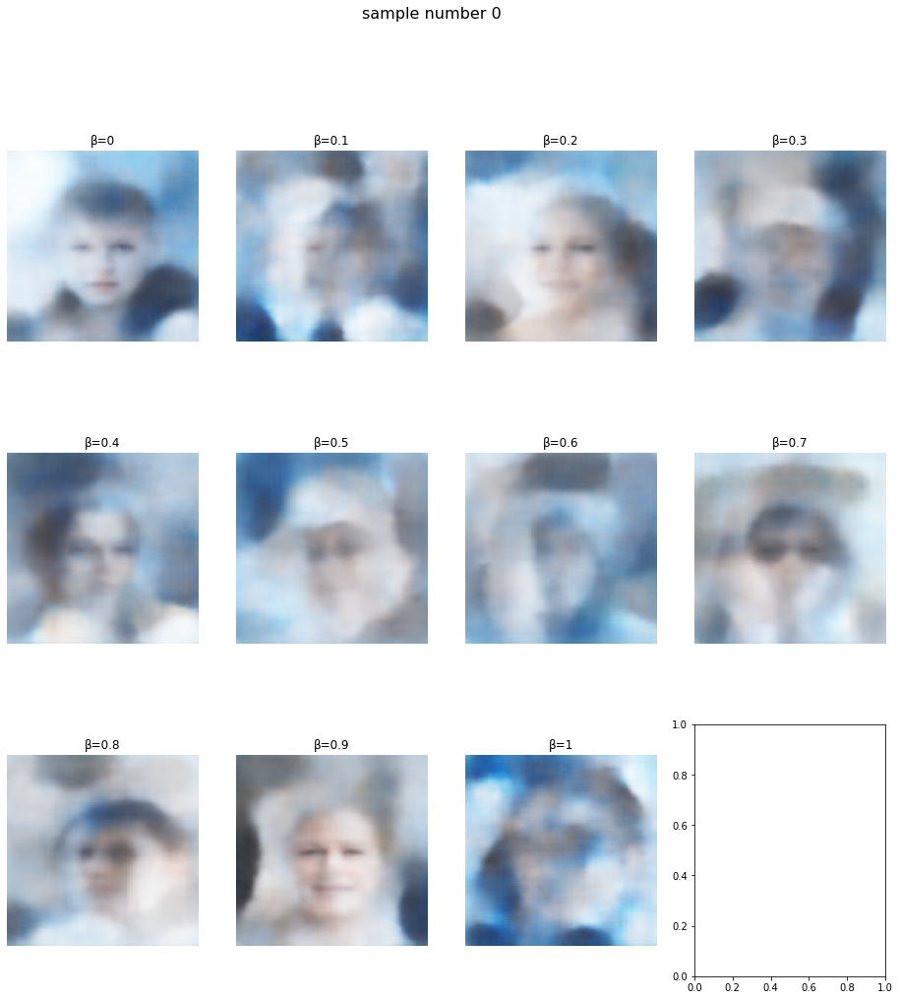

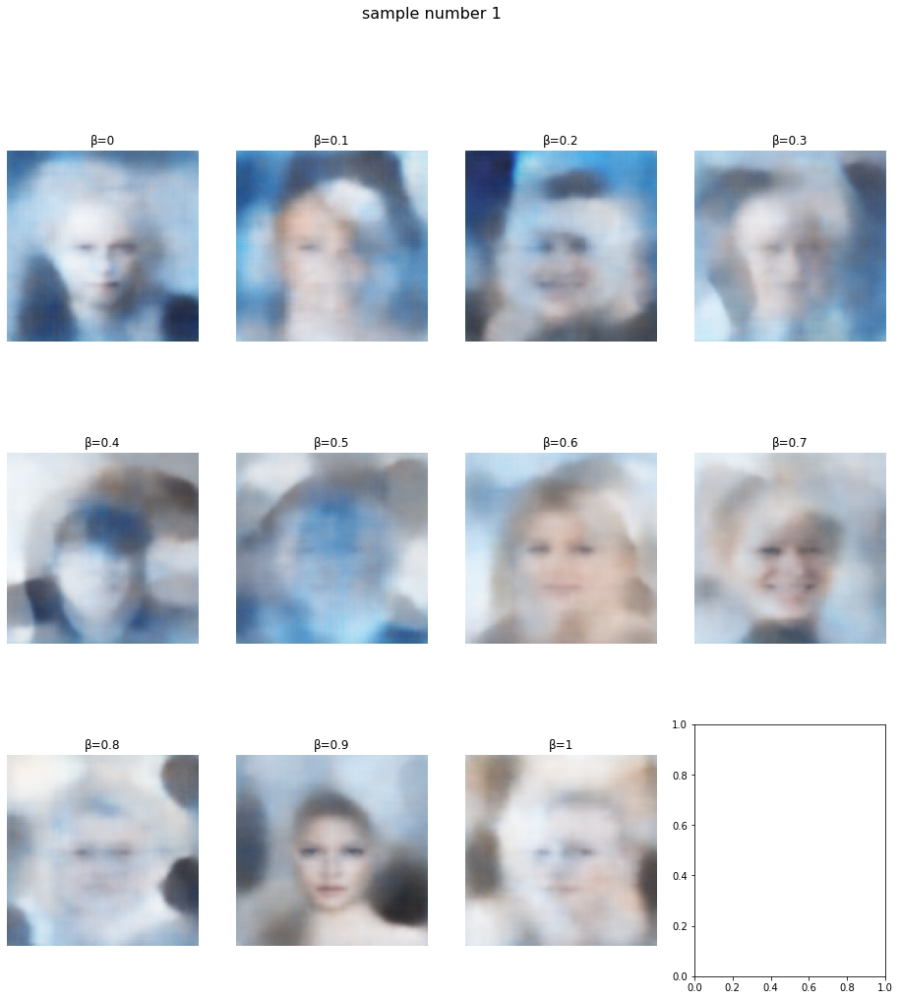

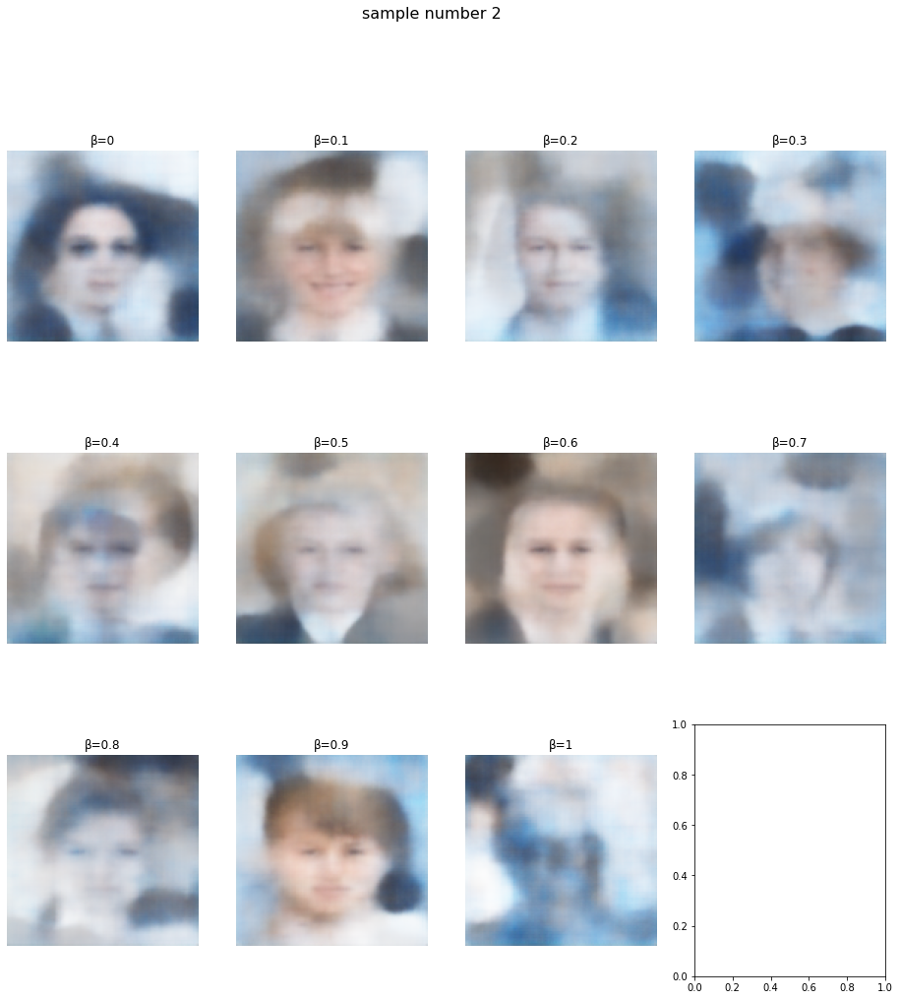

In [23]:
# YOUR CODE GOES HERE


def generate_sample(model,num_sample,latent):
  z= torch.normal(0, 1, size=(num_sample, latent)).to(device)
  sample = model.decode(z) #insert the random noise to the decoder to create new samples.
  return sample

def extrapolation_image(sample,beta):
  # Combine the images using a linear interpolation
  extrapolated_image = beta * sample[0] + (1 - beta) * sample[1]
  return extrapolated_image

def extrapolated_images_plot(extrapolated_images,num,beta):
  fig, axes = plt.subplots(3, 4,figsize=(16,16))   # Create a figure with 8 rows and 4 columns
  axes = np.ravel(axes)  # Flatten the list of axes to make it easier to loop over
  for i in range(len(extrapolated_images)):
    img=extrapolated_images[i]
    if torch.cuda.is_available():
      img = img.cuda()
    with torch.no_grad():
      outimg = np.transpose(img.cpu().numpy(), [1,2,0])
      axes[i].imshow(outimg)
      axes[i].set_title(f'\u03B2={beta[i]}')
      axes[i].axis('off')

  fig.suptitle(f'sample number {num}', fontsize=16)
  plt.show()
  return None

beta_list=[0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
for i in range(3):
  extrapolated_images=[]
  for beta in beta_list:
    sample=generate_sample(model_2,2,latent2)
    extrapolated_images.append(extrapolation_image(sample,beta))
  extrapolated_images_plot(extrapolated_images,i,beta_list)





In question 7 we are trying to generate new images by interpolating between two randomly sampled points in the latent space (35) of a generative model. The  $ \beta $  values are the interpolation coefficients that determine how much of each of the two sampled points is used to generate the new image. By iterating through the values of $ \beta $ from 0 to 1, we can create a "smooth transition" of images that goes from one randomly sampled image to the other.

